## Compare_images

Qui definisco una funzione che, dati i percorsi delle due immagini, ne calcola la FFT, i bit planes e ne mostra le differenze al fine di condurre una prima analisi esplorativa

In [29]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.fft import fft2, fftshift
from skimage import img_as_float
from skimage.color import rgb2gray
from skimage.data import astronaut
from skimage.filters import window
from scipy.spatial import distance as dist
import pandas as pd

from PIL import Image
import cv2

def entropy(image):
    # Calcola l'istogramma dell'immagine
    histogram = cv2.calcHist([image], [0], None, [256], [0, 256])

    # Normalizza l'istogramma
    histogram /= histogram.sum()

    # Calcola l'entropia
    entropy = -np.sum(histogram * np.log2(histogram + np.finfo(float).eps))
    
    return entropy

def bit_planes(path):
  # Read the image
  image = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

  # Divide the image into bit planes
  bit_planes = []
  for i in range(8):
      bit_plane = (image >> i) & 1
      bit_planes.append(bit_plane)
      
  return bit_planes

def calculate_fft_features(image_fft):

    # Calcola le features delle FFT
    fft_mean = np.mean(image_fft)
    fft_std = np.std(image_fft)
    fft_max = np.max(image_fft)
    total_energy = np.sum(np.square(image_fft))

    return fft_mean, fft_std, fft_max, total_energy

def compare_images(stego_path, cover_path):
    stego_image = img_as_float(rgb2gray(Image.open(stego_path)))

    cover_image = img_as_float(rgb2gray(Image.open(cover_path)))

    diff_image = np.abs(stego_image - cover_image)

    stego_image_f = np.abs(fftshift(fft2(stego_image)))
    cover_image_f = np.abs(fftshift(fft2(cover_image)))

    diff_image_f = np.abs(fftshift(fft2(diff_image)))

    fig, axes = plt.subplots(1, 3, figsize=(15, 15))
    ax = axes.ravel()
    ax[0].set_title("Cover image")
    ax[0].imshow(cover_image, cmap='gray')
    ax[1].set_title("Stego image")
    ax[1].imshow(stego_image, cmap='gray')
    ax[2].set_title("Diff image")
    ax[2].imshow(diff_image, cmap='gray')

    plt.show()

    fig, axes = plt.subplots(1, 3, figsize=(15, 15))
    ax = axes.ravel()

    ax[0].set_title("Cover FFT (frequency)")
    ax[0].imshow(np.log(cover_image_f), cmap='magma')
    ax[1].set_title("Stego FFT (frequency)")
    ax[1].imshow(np.log(stego_image_f), cmap='magma')
    ax[2].set_title("Diff FFT (frequency)")
    ax[2].imshow(np.log(diff_image_f), cmap='magma')

    plt.show()
    
    # Calcola e stampa le features delle singole FFT
    cover_fft_mean, cover_fft_std, cover_fft_max, cover_total_energy = calculate_fft_features(cover_image_f)

    cover_dct_array = cv2.dct(np.float32(cover_image))

    stego_fft_mean, stego_fft_std, stego_fft_max, stego_total_energy = calculate_fft_features(stego_image_f)

    stego_dct_array = cv2.dct(np.float32(stego_image))

    diff_fft_mean, diff_fft_std, diff_fft_max, diff_total_energy = calculate_fft_features(diff_image_f)

    diff_dct_array = cv2.dct(np.float32(diff_image))

    data = {
            'Features': ['Cover image', 'Stego image', 'Diff image'],
            'FFT mean': [cover_fft_mean, stego_fft_mean, diff_fft_mean],
            'FFT std': [cover_fft_std, stego_fft_std, diff_fft_std],
            'FFT max': [cover_fft_max, stego_fft_max, diff_fft_max],
            'Total energy': [cover_total_energy, stego_total_energy, diff_total_energy],
            'DCT mean': [cover_dct_array.mean(), stego_dct_array.mean(), diff_dct_array.mean()],
            'DCT std': [cover_dct_array.std(), stego_dct_array.std(), diff_dct_array.std()],
            'DCT cov': [cover_dct_array.std()/cover_dct_array.mean(), stego_dct_array.std()/stego_dct_array.mean(), diff_dct_array.std()/diff_dct_array.mean()],
            'Entropy': [entropy(cv2.imread(cover_path, cv2.IMREAD_GRAYSCALE)), entropy(cv2.imread(stego_path, cv2.IMREAD_GRAYSCALE)), "-"]
        }

    df = pd.DataFrame(data)
    display(df)
    
    im1_array=np.array(cover_image).reshape(-1)
    im2_array=np.array(stego_image).reshape(-1)
    sim = 1 - np.abs(dist.cosine(im1_array, im2_array))
    
    print(f"La distanza del coseno tra cover e stego è di: {sim}")

    print("Cover image bit planes")
    cover_bit_planes = bit_planes(cover_path)

    # Display each bit plane
    fig, axs = plt.subplots(2, 4, figsize=(15, 15))
    axs = axs.ravel()

    for i in range(8):
        axs[i].imshow(cover_bit_planes[i], cmap='gray')
        axs[i].set_title(f'Bit Plane {i}')
        axs[i].axis('off')

    plt.tight_layout()
    plt.show()

    print("Stego image bit planes")
    stego_bit_planes = bit_planes(stego_path)

    # Display each bit plane
    fig, axs = plt.subplots(2, 4, figsize=(15, 15))
    axs = axs.ravel()

    for i in range(8):
        axs[i].imshow(stego_bit_planes[i], cmap='gray')
        axs[i].set_title(f'Bit Plane {i}')
        axs[i].axis('off')

    plt.tight_layout()
    plt.show()

    print("Difference between bit planes")

    diff_bit_planes = []

    for i in range(8):
        diff_bit_planes.append(np.abs(cover_bit_planes[i] - stego_bit_planes[i]))

    fig, axs = plt.subplots(2, 4, figsize=(15, 15))
    axs = axs.ravel()

    for i in range(8):
        axs[i].imshow(diff_bit_planes[i], cmap='gray')
        axs[i].set_title(f'Bit Plane {i}')
        axs[i].axis('off')
    plt.tight_layout()
    plt.show()

# Analisi immagini campione

Di seguito vengono analizzate delle immagini casuali insieme alla loro variante con stegonografia con l'obbiettivo di riuscire ad individuare delle caratteristiche comuni

In [27]:
import os

path_stego = 'data/uerd/stego/'
path_cover = 'data/uerd/cover/'

Image 001123.jpg


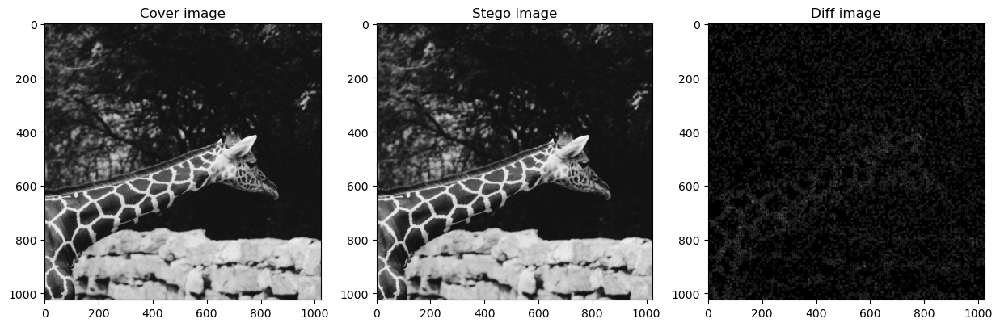

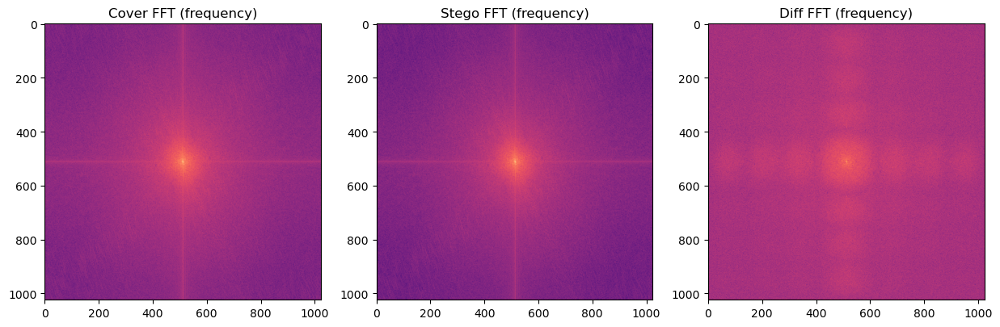

,Features,FFT mean,FFT std,FFT max,Total energy,DCT mean,DCT std,DCT cov,Entropy
0,Cover image,31.907080,432.102943,365634.505891,1.968502e+11,0.000243,0.423124,1740.459961,6.528988
1,Stego image,31.846040,432.109147,365643.635547,1.968518e+11,0.000249,0.423126,1702.329224,6.518282
2,Diff image,1.647518,1.966960,1307.960539,6.903032e+06,0.000008,0.002506,333.112518,-


La distanza del coseno tra cover e stego è di: 0.9999824663599037
Cover image bit planes


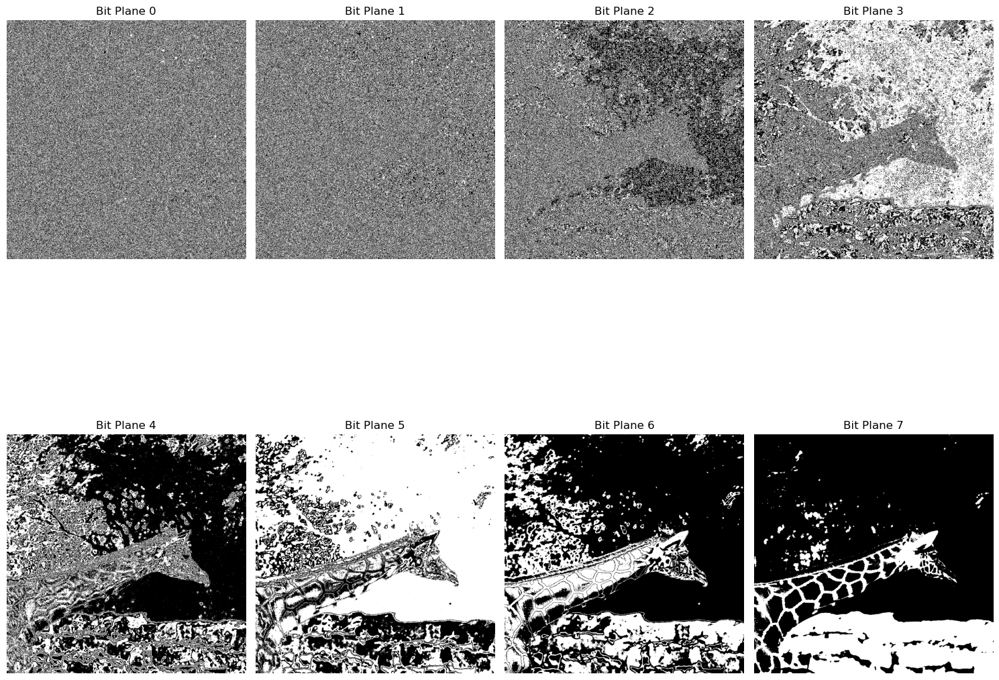

Stego image bit planes


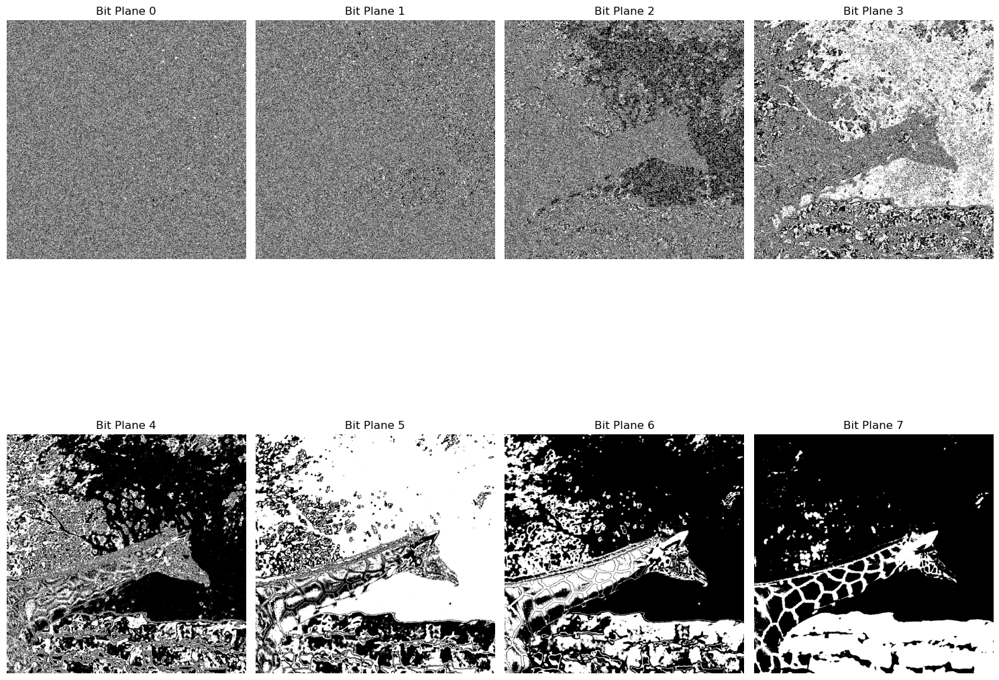

Difference between bit planes


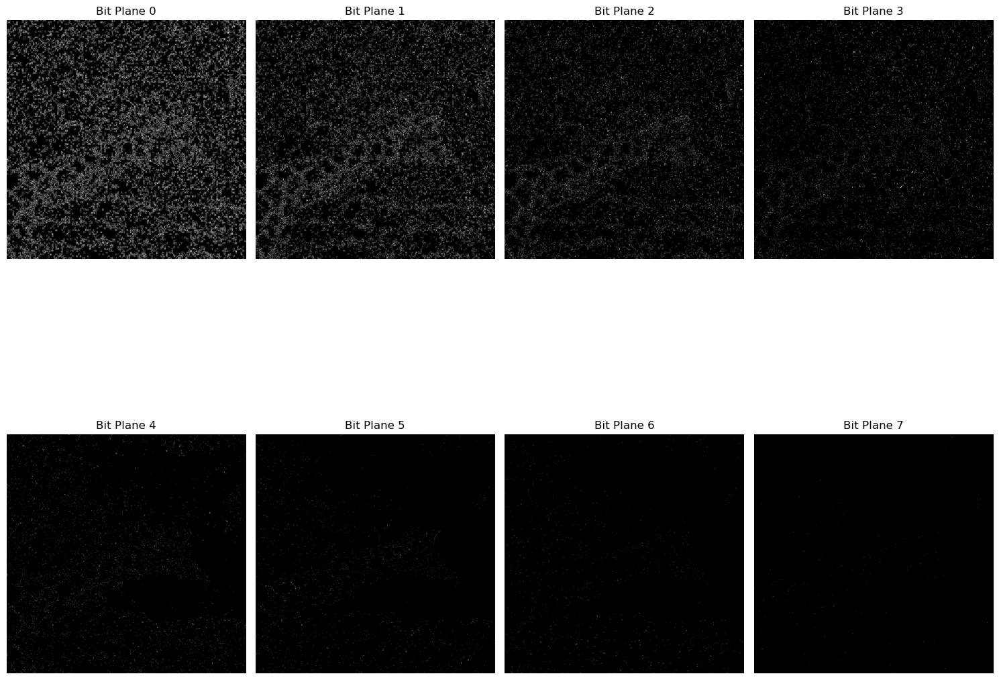

----------------------------------------------------------------------------------------------------
Image 001125.jpg


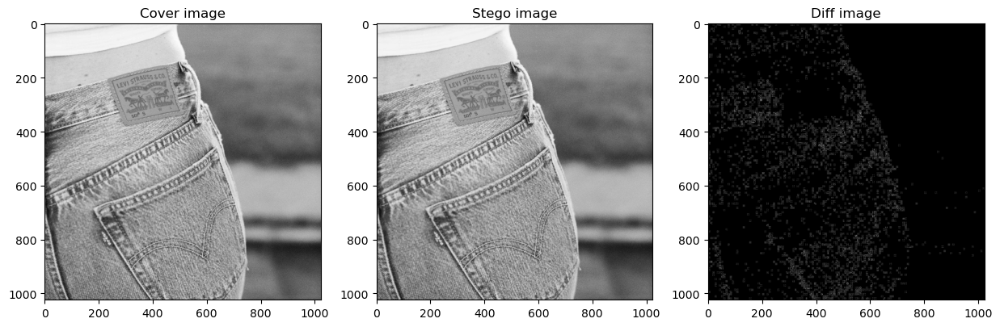

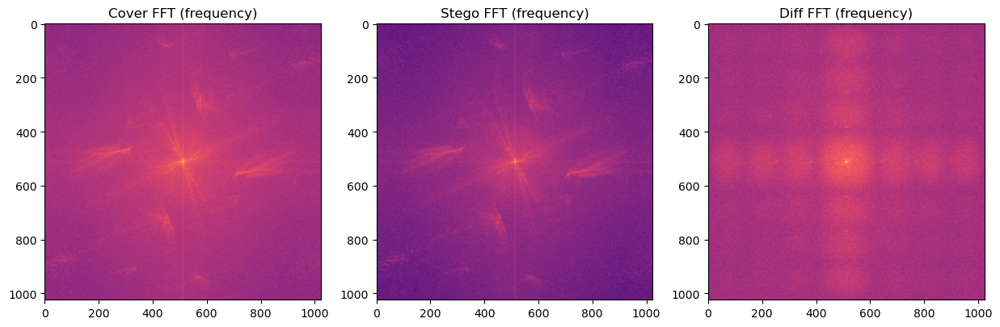

,Features,FFT mean,FFT std,FFT max,Total energy,DCT mean,DCT std,DCT cov,Entropy
0,Cover image,47.452287,640.619718,634582.429127,4.326900e+11,7.933652e-04,0.627319,790.705933,7.404809
1,Stego image,47.434503,640.615837,634579.830383,4.326830e+11,7.933800e-04,0.627314,790.684875,7.403205
2,Diff image,1.103002,1.403453,595.629862,3.341073e+06,3.151856e-07,0.001743,5530.656250,-


La distanza del coseno tra cover e stego è di: 0.999996139185624
Cover image bit planes


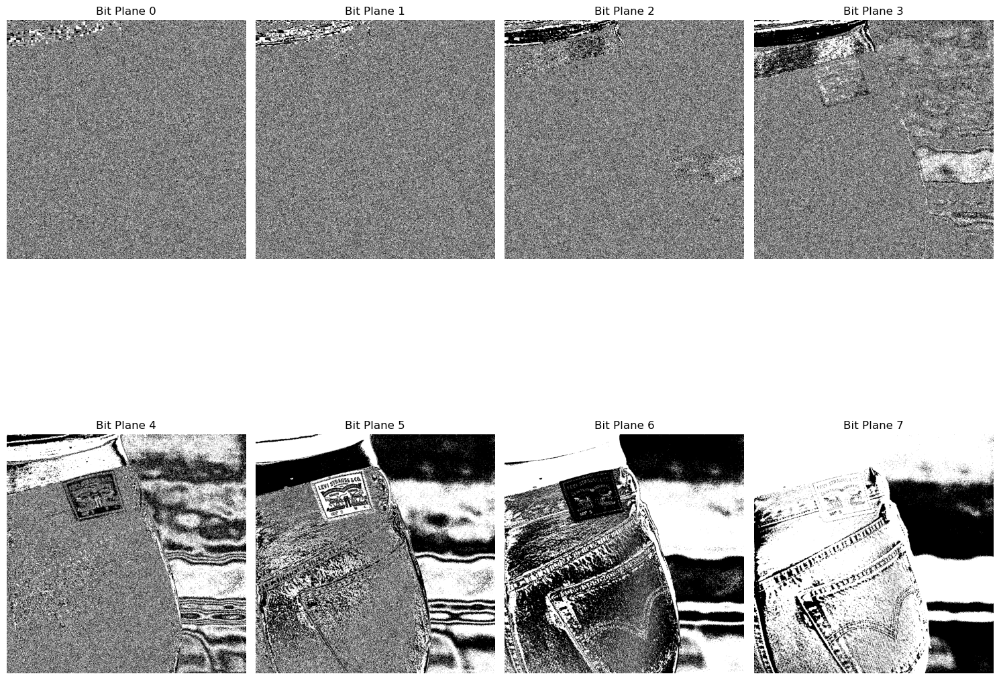

Stego image bit planes


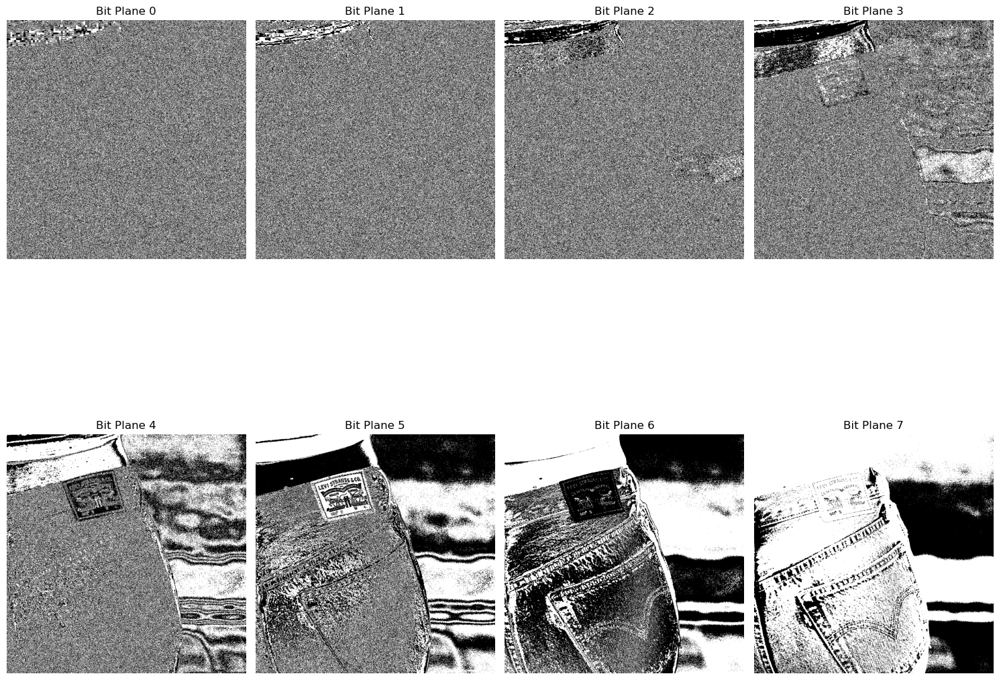

Difference between bit planes


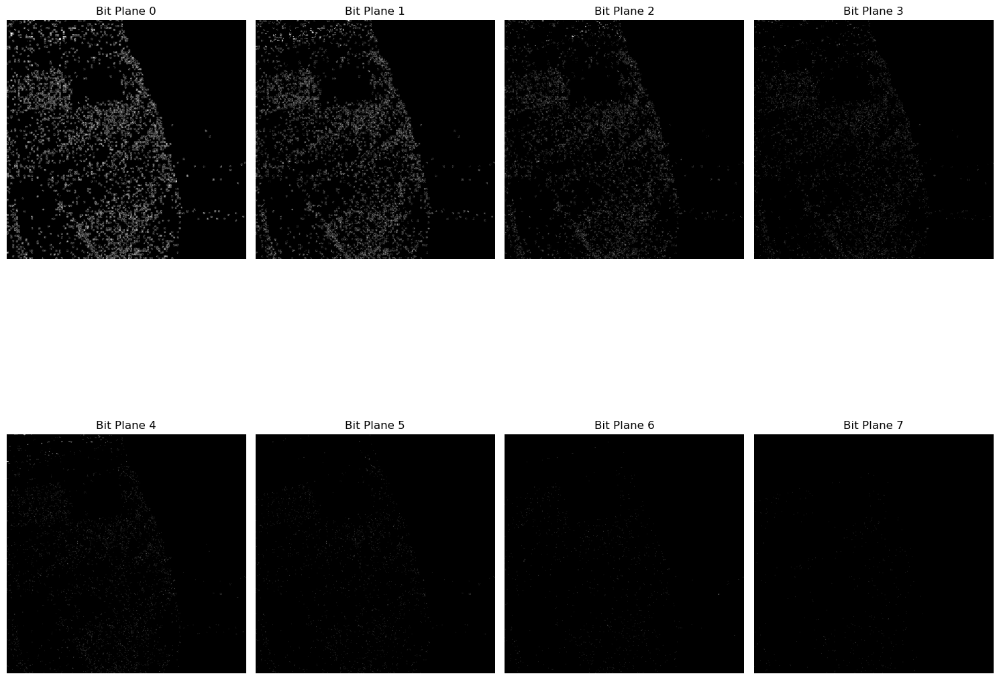

----------------------------------------------------------------------------------------------------


In [30]:
for image in os.listdir(path_stego)[403:405]:
    print(f"Image {image}")
    compare_images(path_cover + image, path_stego + image)
    print('-'*100)

## Calcolo istogramma e guassiana sull'intero dataset

In [136]:
import matplotlib.pyplot as plt

import numpy as np
from scipy.fft import fft2, fftshift
from skimage import img_as_float
from skimage.color import rgb2gray
from skimage.data import astronaut
from skimage.filters import window
from scipy.spatial import distance as dist
from scipy.stats import norm

import pandas as pd

from PIL import Image
import cv2

def entropy(image):
    # Calcola l'istogramma dell'immagine
    histogram = cv2.calcHist([image], [0], None, [256], [0, 256])

    # Normalizza l'istogramma
    histogram /= histogram.sum()

    # Calcola l'entropia
    entropy = -np.sum(histogram * np.log2(histogram + np.finfo(float).eps))
    
    return entropy

def bit_planes(path):
  # Read the image
  image = cv2.imread(path, cv2.IMREAD_GRAYSCALE)

  # Divide the image into bit planes
  bit_planes = []
  for i in range(8):
      bit_plane = (image >> i) & 1
      bit_planes.append(bit_plane)
      
  return bit_planes

def calculate_fft_features(image_fft):

    # Calcola le features delle FFT
    fft_mean = np.mean(image_fft)
    fft_std = np.std(image_fft)
    fft_max = np.max(image_fft)
    total_energy = np.sum(np.square(image_fft))

    return fft_mean, fft_std, fft_max, total_energy

def calculate_gaussians(stego_path, cover_path):
    cover_fft_mean_list, cover_fft_std_list, cover_fft_max_list, cover_total_energy_list, cover_dct_mean_list, cover_dct_std_list, cover_entropy_list = [], [], [], [], [], [], []
    stego_fft_mean_list, stego_fft_std_list, stego_fft_max_list, stego_total_energy_list, stego_dct_mean_list, stego_dct_std_list, stego_entropy_list = [], [], [], [], [], [], []
    
    cosine_sim_list = []
    
    tot_images = len(os.listdir(stego_path))
    i = 0
    for image in os.listdir(stego_path):
        i += 1  
        
        if (i % (tot_images // 10) == 0):
            progress = (i / tot_images) * 100
            print(f"Percentuale di immagini analizzate: {progress}%")
        
        stego_image = img_as_float(rgb2gray(Image.open(stego_path + image)))

        cover_image = img_as_float(rgb2gray(Image.open(cover_path + image)))

        stego_image_f = np.abs(fftshift(fft2(stego_image)))
        cover_image_f = np.abs(fftshift(fft2(cover_image)))

        cover_fft_mean, cover_fft_std, cover_fft_max, cover_total_energy = calculate_fft_features(cover_image_f)
        cover_dct_array = cv2.dct(np.float32(cover_image))
        
        cover_fft_mean_list.append(cover_fft_mean)
        cover_fft_std_list.append(cover_fft_std)
        cover_fft_max_list.append(cover_fft_max)
        cover_total_energy_list.append(cover_total_energy)
        cover_dct_mean_list.append(cover_dct_array.mean())
        cover_dct_std_list.append(cover_dct_array.std())
        cover_entropy_list.append(entropy(cv2.imread(cover_path + image, cv2.IMREAD_GRAYSCALE)))

        

        stego_fft_mean, stego_fft_std, stego_fft_max, stego_total_energy = calculate_fft_features(stego_image_f)

        stego_dct_array = cv2.dct(np.float32(stego_image))
        
        stego_fft_mean_list.append(stego_fft_mean)
        stego_fft_std_list.append(stego_fft_std)
        stego_fft_max_list.append(stego_fft_max)
        stego_total_energy_list.append(stego_total_energy)
        stego_dct_mean_list.append(stego_dct_array.mean())
        stego_dct_std_list.append(stego_dct_array.std())
        stego_entropy_list.append(entropy(cv2.imread(stego_path + image, cv2.IMREAD_GRAYSCALE)))
        
        im1_array=np.array(cover_image).reshape(-1)
        im2_array=np.array(stego_image).reshape(-1)
        sim = 1 - np.abs(dist.cosine(im1_array, im2_array))
        
        cosine_sim_list.append(sim)
        
    fig, gaussians = plt.subplots(2,3, figsize=(15, 5))
    
    x = np.linspace(-1000, 1000, 100)
    pdf_cover_fft = norm.pdf(x, np.array(cover_fft_mean_list).mean(), np.array(cover_fft_std_list).mean())
    gaussians[0, 0].set_title('Cover FFT gaussian')
    gaussians[0, 0].plot(x, pdf_cover_fft, color='blue', linewidth=2)
    
    x = np.linspace(-1, 1, 100)
    pdf = norm.pdf(x, np.array(cover_dct_mean_list).mean(), np.array(cover_dct_std_list).mean())
    gaussians[0, 1].set_title('Cover DCT gaussian')
    gaussians[0, 1].plot(x, pdf, color='blue', linewidth=2)
    
    
    x = np.arange(4.0, 9.0, 0.01)
    pdf = norm.pdf(x, np.array(cover_entropy_list).mean(), np.array(cover_entropy_list).std())
    gaussians[0, 2].set_title('Cover Entropy gaussian')
    gaussians[0, 2].plot(x, pdf, color='blue', linewidth=2)
    
    # Stego gaussians
    x = np.linspace(-1000, 1000, 100)
    pdf = norm.pdf(x, np.array(stego_fft_mean_list).mean(), np.array(stego_fft_std_list).mean())
    gaussians[1, 0].set_title('Stego FFT gaussian')
    gaussians[1, 0].plot(x, pdf, color='blue', linewidth=2)

    x = np.linspace(-1, 1, 100)
    pdf = norm.pdf(x, np.array(stego_dct_mean_list).mean(), np.array(stego_dct_std_list).mean())
    gaussians[1, 1].set_title('Stego DCT gaussian')
    gaussians[1, 1].plot(x, pdf, color='blue', linewidth=2)
    
    
    x = np.arange(4.0, 9.0, 0.01)
    pdf = norm.pdf(x, np.array(stego_entropy_list).mean(), np.array(stego_entropy_list).std())
    gaussians[1,2].set_title('Stego Entropy gaussian')
    gaussians[1,2].plot(x, pdf, color='blue', linewidth=2)

    plt.tight_layout()
    plt.legend()
    plt.show()
    
    x = np.arange(0.9, 1.1, 0.01)
    pdf = norm.pdf(x, np.array(cosine_sim_list).mean(), np.array(cosine_sim_list).std())
    normalized_pdf = pdf / np.sum(pdf)
    plt.plot(x, normalized_pdf, color='blue', linewidth=2)
    plt.title("Cosine similarity gaussian")
    plt.show()
    

Percentuale di immagini analizzate: 9.996725069592271%
Percentuale di immagini analizzate: 19.993450139184542%
Percentuale di immagini analizzate: 29.990175208776815%
Percentuale di immagini analizzate: 39.986900278369085%
Percentuale di immagini analizzate: 49.98362534796136%
Percentuale di immagini analizzate: 59.98035041755363%
Percentuale di immagini analizzate: 69.9770754871459%
Percentuale di immagini analizzate: 79.97380055673817%
Percentuale di immagini analizzate: 89.97052562633044%
Percentuale di immagini analizzate: 99.96725069592271%


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


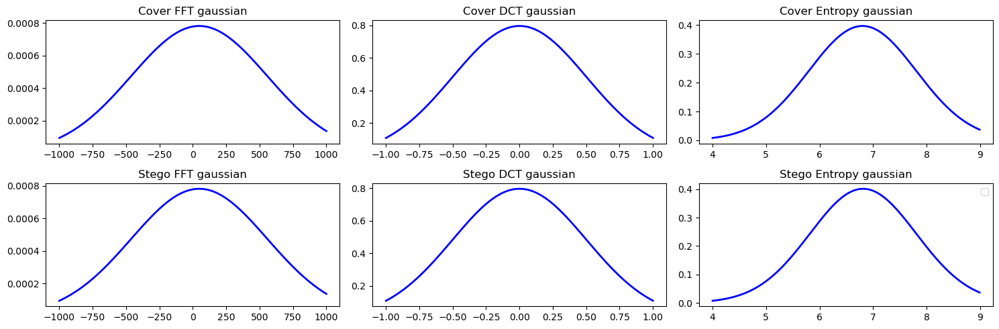

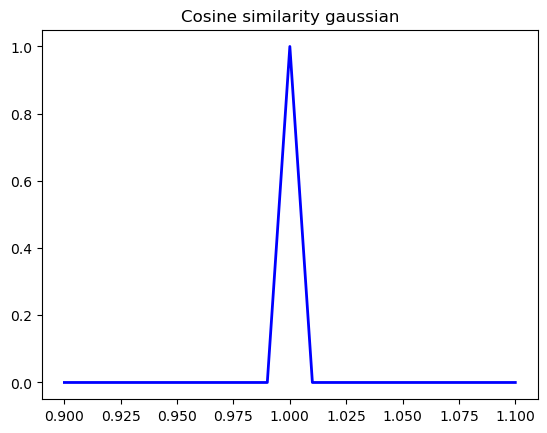

In [137]:
calculate_gaussians(path_stego, path_cover)

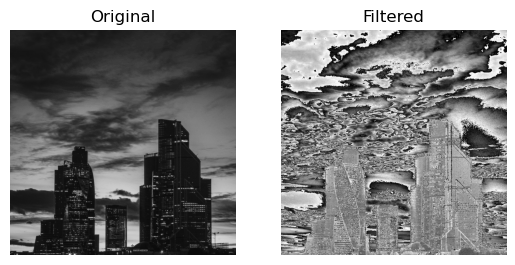

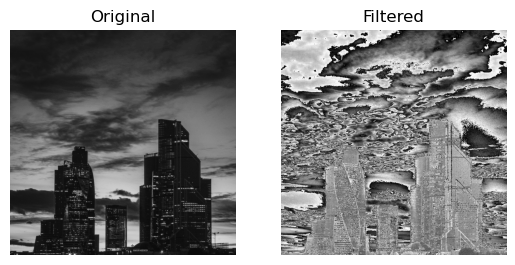

╒═══════════════╤═════════╤═════════╤══════════════════╤══════════════════╕
│       Metrica │   Cover │   Stego │   Filtered Cover │   Filtered Stego │
╞═══════════════╪═════════╪═════════╪══════════════════╪══════════════════╡
│     Max image │     255 │     255 │               31 │               31 │
├───────────────┼─────────┼─────────┼──────────────────┼──────────────────┤
│    Mean image │ 67.7292 │ 67.7299 │          16.0251 │          16.0231 │
├───────────────┼─────────┼─────────┼──────────────────┼──────────────────┤
│     Std image │ 50.2884 │   50.29 │          9.07021 │          9.07161 │
├───────────────┼─────────┼─────────┼──────────────────┼──────────────────┤
│ Entropy image │ 7.20999 │ 7.21137 │          4.99185 │          4.99205 │
╘═══════════════╧═════════╧═════════╧══════════════════╧══════════════════╛
----------------------------------------------------------------------------------------------------


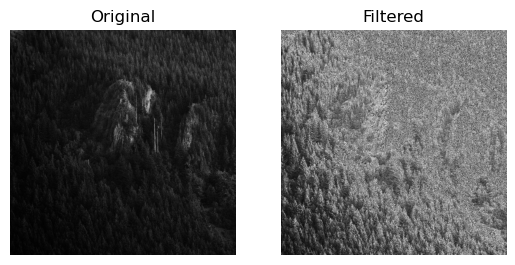

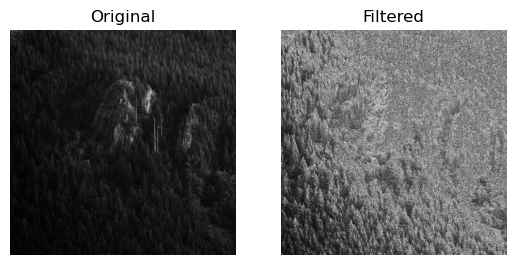

╒═══════════════╤═════════╤═════════╤══════════════════╤══════════════════╕
│       Metrica │   Cover │   Stego │   Filtered Cover │   Filtered Stego │
╞═══════════════╪═════════╪═════════╪══════════════════╪══════════════════╡
│     Max image │     213 │     213 │               31 │               31 │
├───────────────┼─────────┼─────────┼──────────────────┼──────────────────┤
│    Mean image │ 21.2884 │ 21.2883 │          14.2256 │          14.2228 │
├───────────────┼─────────┼─────────┼──────────────────┼──────────────────┤
│     Std image │ 16.3587 │ 16.3664 │          7.86736 │          7.87407 │
├───────────────┼─────────┼─────────┼──────────────────┼──────────────────┤
│ Entropy image │ 5.65496 │ 5.65763 │          4.90916 │          4.91022 │
╘═══════════════╧═════════╧═════════╧══════════════════╧══════════════════╛
----------------------------------------------------------------------------------------------------


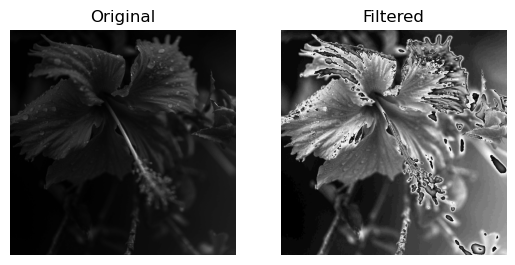

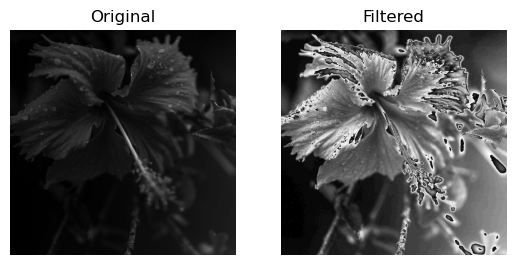

╒═══════════════╤═════════╤═════════╤══════════════════╤══════════════════╕
│       Metrica │   Cover │   Stego │   Filtered Cover │   Filtered Stego │
╞═══════════════╪═════════╪═════════╪══════════════════╪══════════════════╡
│     Max image │     169 │     169 │               31 │               31 │
├───────────────┼─────────┼─────────┼──────────────────┼──────────────────┤
│    Mean image │ 15.0934 │ 15.0952 │          11.4351 │          11.4351 │
├───────────────┼─────────┼─────────┼──────────────────┼──────────────────┤
│     Std image │ 12.9874 │ 12.9872 │          7.96816 │          7.96693 │
├───────────────┼─────────┼─────────┼──────────────────┼──────────────────┤
│ Entropy image │ 5.31658 │ 5.31822 │          4.80092 │           4.8022 │
╘═══════════════╧═════════╧═════════╧══════════════════╧══════════════════╛
----------------------------------------------------------------------------------------------------


In [260]:
def bitmask(image, mask):
    fig, ax = plt.subplots(1,2,)
    
    ax[0].set_title("Original")
    ax[0].imshow(image, cmap= "gray")
    ax[0].axis(False)
    
    filter_mask = np.ones_like(image) * mask

    # Applica l'operazione di bitwise AND tra l'immagine e la maschera
    filtered_image = cv2.bitwise_and(image, filter_mask)
    
    filter_mask = np.ones_like(image) * filtered_image.min()

    filtered_image = filtered_image - filter_mask
    
    ax[1].set_title("Filtered")
    ax[1].imshow(filtered_image, cmap="gray")
    ax[1].axis(False)
    
    plt.show()
    
    return filtered_image

for image in os.listdir(path_stego)[:3]:
    cover = cv2.imread(path_cover + image, cv2.IMREAD_GRAYSCALE)
    
    stego = cv2.imread(path_stego + image, cv2.IMREAD_GRAYSCALE)
    
    filtered_cover = bitmask(cover,0x1F)
    filtered_stego = bitmask(stego,0x1F)
    
    from tabulate import tabulate

    # Creazione della tabella
    table_image = [
        ["Max image", cover.max(), stego.max(), filtered_cover.max(), filtered_stego.max()],
        ["Mean image", cover.mean(), stego.mean(), filtered_cover.mean(), filtered_stego.mean()],
        ["Std image", cover.std(), stego.std(), filtered_cover.std(), filtered_stego.std()],
        ["Entropy image", entropy(cover), entropy(stego), entropy(filtered_cover), entropy(filtered_stego)]
    ]

    # Stampa della tabella
    print(tabulate(table_image, headers=["Metrica", "Cover", "Stego", "Filtered Cover", "Filtered Stego"], tablefmt="fancy_grid", stralign="right", numalign="right"))
    
    print('-'*100)

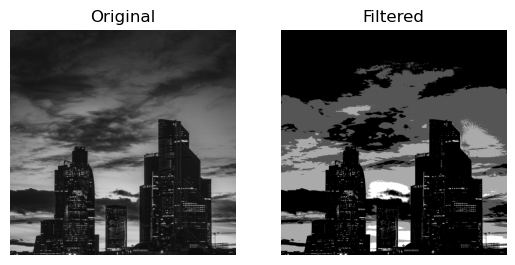

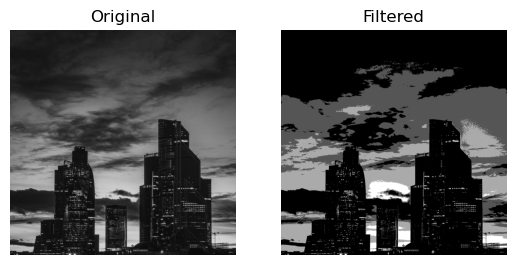

╒═══════════════╤═════════╤═════════╤══════════════════╤══════════════════╕
│       Metrica │   Cover │   Stego │   Filtered Cover │   Filtered Stego │
╞═══════════════╪═════════╪═════════╪══════════════════╪══════════════════╡
│     Max image │     255 │     255 │              192 │              192 │
├───────────────┼─────────┼─────────┼──────────────────┼──────────────────┤
│    Mean image │ 67.7292 │ 67.7299 │           37.213 │          37.2122 │
├───────────────┼─────────┼─────────┼──────────────────┼──────────────────┤
│     Std image │ 50.2884 │   50.29 │          50.7135 │           50.713 │
├───────────────┼─────────┼─────────┼──────────────────┼──────────────────┤
│ Entropy image │ 7.20999 │ 7.21137 │          1.45087 │          1.45084 │
╘═══════════════╧═════════╧═════════╧══════════════════╧══════════════════╛
----------------------------------------------------------------------------------------------------


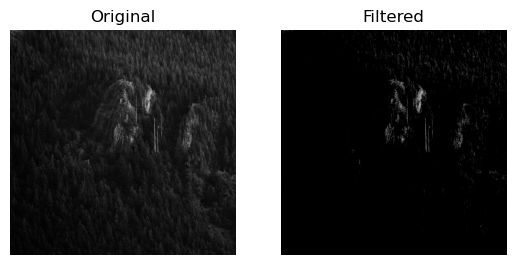

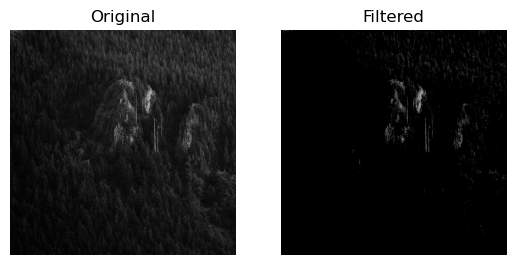

╒═══════════════╤═════════╤═════════╤══════════════════╤══════════════════╕
│       Metrica │   Cover │   Stego │   Filtered Cover │   Filtered Stego │
╞═══════════════╪═════════╪═════════╪══════════════════╪══════════════════╡
│     Max image │     213 │     213 │              192 │              192 │
├───────────────┼─────────┼─────────┼──────────────────┼──────────────────┤
│    Mean image │ 21.2884 │ 21.2883 │          1.61115 │          1.61188 │
├───────────────┼─────────┼─────────┼──────────────────┼──────────────────┤
│     Std image │ 16.3587 │ 16.3664 │          10.8095 │           10.813 │
├───────────────┼─────────┼─────────┼──────────────────┼──────────────────┤
│ Entropy image │ 5.65496 │ 5.65763 │         0.168806 │         0.168861 │
╘═══════════════╧═════════╧═════════╧══════════════════╧══════════════════╛
----------------------------------------------------------------------------------------------------


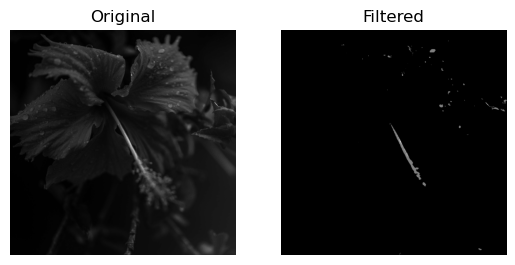

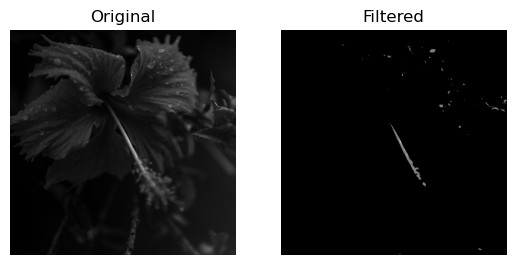

╒═══════════════╤═════════╤═════════╤══════════════════╤══════════════════╕
│       Metrica │   Cover │   Stego │   Filtered Cover │   Filtered Stego │
╞═══════════════╪═════════╪═════════╪══════════════════╪══════════════════╡
│     Max image │     169 │     169 │              128 │              128 │
├───────────────┼─────────┼─────────┼──────────────────┼──────────────────┤
│    Mean image │ 15.0934 │ 15.0952 │         0.333008 │         0.333313 │
├───────────────┼─────────┼─────────┼──────────────────┼──────────────────┤
│     Std image │ 12.9874 │ 12.9872 │          4.71186 │          4.71474 │
├───────────────┼─────────┼─────────┼──────────────────┼──────────────────┤
│ Entropy image │ 5.31658 │ 5.31822 │        0.0468643 │        0.0468986 │
╘═══════════════╧═════════╧═════════╧══════════════════╧══════════════════╛
----------------------------------------------------------------------------------------------------


In [256]:
for image in os.listdir(path_stego)[:3]:
    cover = cv2.imread(path_cover + image, cv2.IMREAD_GRAYSCALE)
    
    stego = cv2.imread(path_stego + image, cv2.IMREAD_GRAYSCALE)
    
    filtered_cover = bitmask(cover,0xC0)
    filtered_stego = bitmask(stego,0xC0)
    
    from tabulate import tabulate

    # Creazione della tabella
    table_image = [
        ["Max image", cover.max(), stego.max(), filtered_cover.max(), filtered_stego.max()],
        ["Mean image", cover.mean(), stego.mean(), filtered_cover.mean(), filtered_stego.mean()],
        ["Std image", cover.std(), stego.std(), filtered_cover.std(), filtered_stego.std()],
        ["Entropy image", entropy(cover), entropy(stego), entropy(filtered_cover), entropy(filtered_stego)]
    ]

    # Stampa della tabella
    print(tabulate(table_image, headers=["Metrica", "Cover", "Stego", "Filtered Cover", "Filtered Stego"], tablefmt="fancy_grid", stralign="right", numalign="right"))
    
    print('-'*100)